# Evaluating UNet performance and Counting Cells
Here we apply the UNet to the unlabelled test set to see more or less how it performs. We also use cv2 to count the cells in the resulting mask

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/ML team project/Project 2/Neubauer Chamber Automation

!pip install import-ipynb

Mounted at /content/drive
/content/drive/.shortcut-targets-by-id/12swurGjFVTSgi6fpziRcJ-tqsj6OoBgK/ML team project/Project 2/Neubauer Chamber Automation
  Created wheel for import-ipynb: filename=import_ipynb-0.1.3-py3-none-any.whl size=2975 sha256=452fb1c2dd7894311dfacc547752767b852adbc7e4d35e409a59a1001aec56c2
  Stored in directory: /root/.cache/pip/wheels/b1/5e/dc/79780689896a056199b0b9f24471e3ee184fbd816df355d5f0
Successfully built import-ipynb


In [ ]:
import import_ipynb
from DataSets import NeubauerDataset
from UNetModel import UNet

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Resize, RandomCrop

import numpy as np
import cv2
import time
import os

import matplotlib.pyplot as plt

#Get the unlabelled test set paths
UNLABELLED_CELL_PATH = 'Data Set/test/'
im_paths = os.listdir(UNLABELLED_CELL_PATH)
im_paths = [UNLABELLED_CELL_PATH+filename for filename in im_paths]

In [ ]:
state_dict = torch.load('models/unet2_bilinear_CombinedLoss.pt', map_location=torch.device('cpu'))['model_state_dict']
model = UNet(3,2)
model.load_state_dict(state_dict)

<All keys matched successfully>

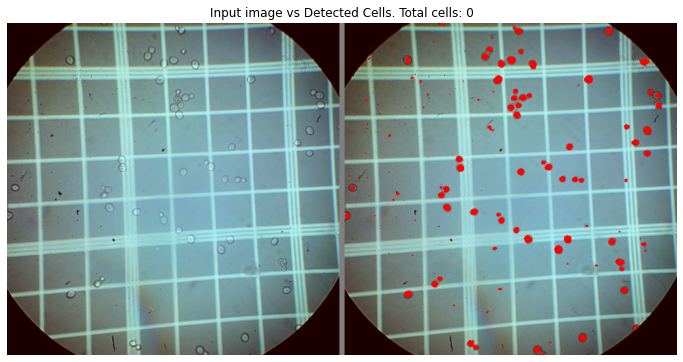

In [ ]:
#Get models predictions
def get_predictions(model, images):
    model.eval()
    with torch.no_grad():
        out = model(images).detach()
        #Argmax is used to binarise the image
        pred_mask = out.argmax(dim=1)
    return pred_mask

#Get a random batch. 
def get_batch(batch_size):
    inds = np.random.randint(0, len(im_paths)-1, batch_size)
    batch = []
    for i in inds:
        im = cv2.imread(im_paths[i])/255.0
        im = torch.from_numpy(im.astype('float32')).transpose(2,0).unsqueeze(0)
        im = Resize((512,512))(im)
        batch.append(im)
    return torch.cat(batch, dim=0)

#Display the masked cells and the final count
def display_masks(im_batch, pred_batch, count=0):
    margin = torch.ones((512,8,3))*0.5
    if pred_batch.size(0)==1:
        rows = 1
        cols = 1
    else:
        rows = pred_batch.size(0)//2
        cols = 2
    fig, axs = plt.subplots(rows, cols, figsize=(12,12))

    axs = axs.flatten() if pred_batch.size(0)>1 else [axs]
    for i, ax in enumerate(axs):
        im = im_batch[i].transpose(2,0).transpose(1,0).numpy()
        detected = im.copy()
        mask = pred_batch[i].numpy()
        detected[mask==1,0] = 1
        detected[mask==1,1] = 0
        detected[mask==1,2] = 0
        combined = np.concatenate([im,margin,detected], axis=1)
        ax.imshow(combined)
        ax.axis('off')
        ax.set_title(f'Input image vs Detected Cells. Total cells: {count}')

images = get_batch(1)
pred_masks = get_predictions(model, images)
display_masks(images, pred_masks)

In [ ]:
#Cell counting function
def count_cells(image, mask, thresh=1, plot=True):
    contours,hierarchy = cv2.findContours(mask, 1, 2)

    out = image.copy()
    coords = []
    for cnt in contours:
        #Find minimum enclosing circle
        (x,y),radius = cv2.minEnclosingCircle(cnt)
        if radius < thresh:
            continue
        #Save values and annotate the image
        center = (int(x),int(y))
        radius = int(radius)
        coords.append([int(x), int(y), radius])
        cv2.circle(out,center,radius,(0,255,0),2)
    #Plot
    if plot:
        plt.imshow(np.concatenate([image,out],axis=1))
        plt.axis('off')
        plt.title(f'Input image vs Cells detected. Total count: {len(coords)}')

    return out, np.array(coords)

image = images[0].transpose(2,0).transpose(1,0).numpy()
image = (image*255).astype('uint8')
mask = (pred_masks[0].numpy()*255).astype('uint8')
_, c = count_cells(image, mask)

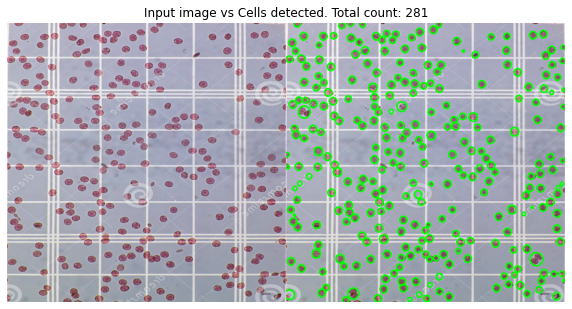

In [ ]:
im = cv2.imread('Data set/Originals/Images/1.PNG')/255.0
im = torch.from_numpy(im.astype('float32')).transpose(2,0).unsqueeze(0)
im = Resize((512,512))(im)

pred_masks = get_predictions(model, im)
image = im[0].transpose(2,0).transpose(1,0).numpy()
image = (image*255).astype('uint8')
mask = (pred_masks[0].numpy()*255).astype('uint8')
plt.figure(figsize=(10,10))
_, cell_coords = count_cells(image, mask, thresh=2, plot=True)

# All images

Here we evaluate on the unlabelled test set

### Only dice_loss

Model trained only with dice loss

In [ ]:
state_dict = torch.load('models/unet2_bilinear_diceloss.pt', map_location=torch.device('cpu'))['model_state_dict']
model = UNet2(3,2)
model.load_state_dict(state_dict)

<All keys matched successfully>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


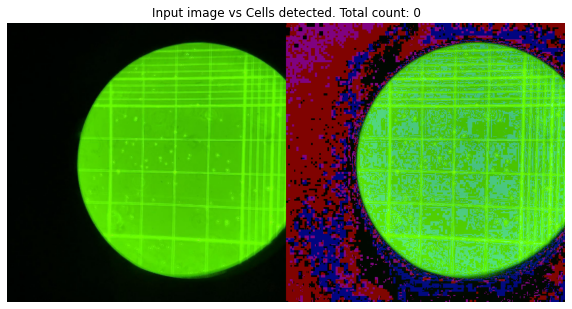

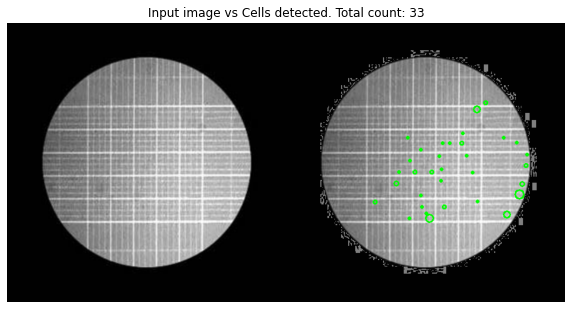

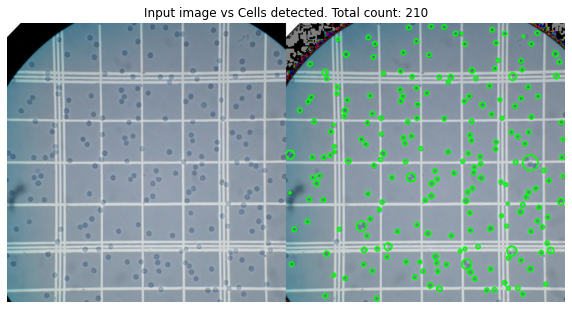

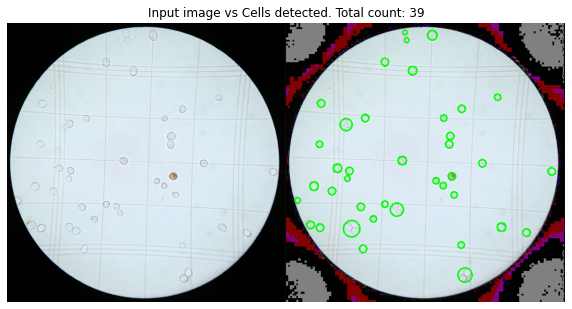

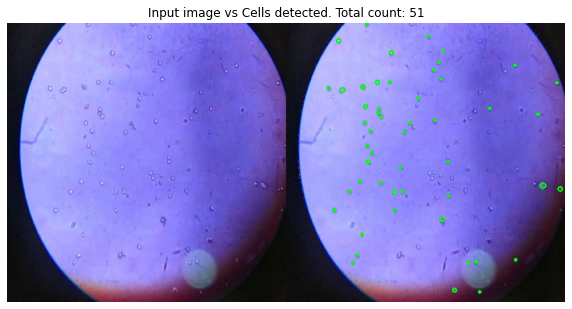

...

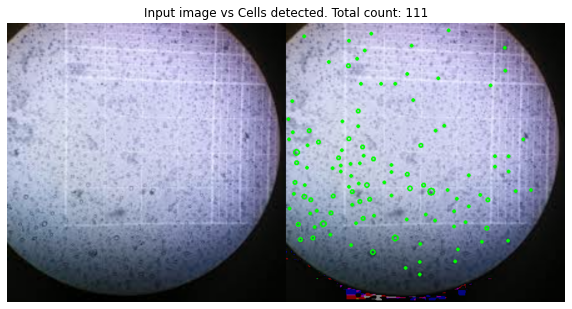

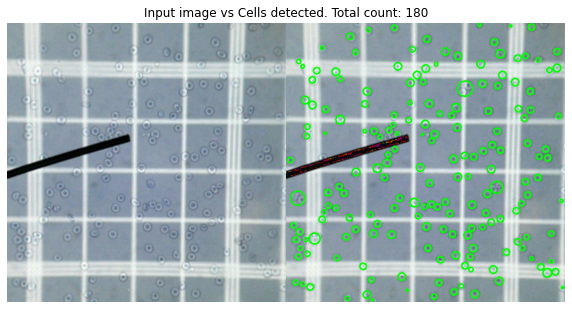

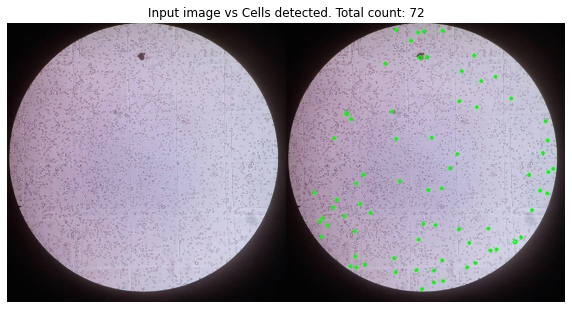

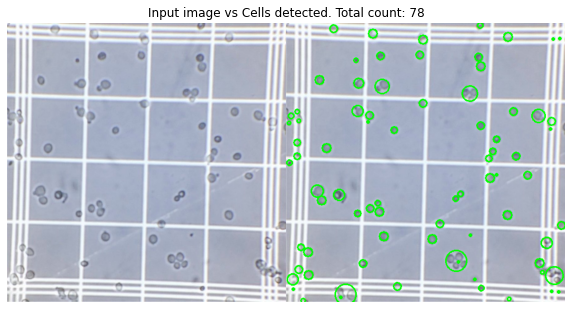

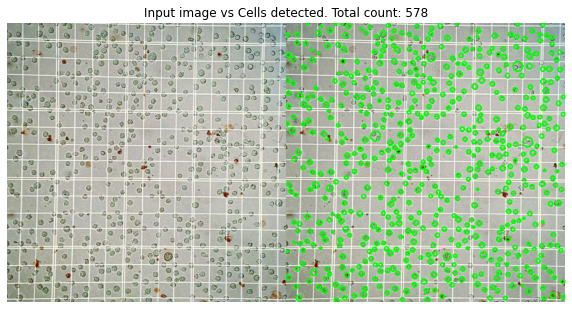

In [ ]:
for im_path in im_paths:
    if '.gif' in im_path:
        continue
    im = cv2.imread(im_path)/255.0
    im = torch.from_numpy(im.astype('float32')).transpose(2,0).unsqueeze(0)
    im = Resize((512,512))(im)

    pred_masks = get_predictions(model, im)
    
    image = im[0].transpose(2,0).transpose(1,0).numpy()
    image = (image*255).astype('uint8')
    mask = (pred_masks[0].numpy()*255).astype('uint8')
    plt.figure(figsize=(10,10))
    _, cell_coords = count_cells(image, mask, thresh=2, plot=True)
    
    #plt.figure()
    #display_masks(im, pred_masks, len(cell_coords))

### Using CombinedLoss

This model performs slightly better, and is the one we use

In [ ]:
state_dict = torch.load('models/unet2_bilinear_CombinedLoss.pt', map_location=torch.device('cpu'))['model_state_dict']
model = UNet2(3,2)
model.load_state_dict(state_dict)

<All keys matched successfully>

In [ ]:
for im_path in im_paths:
    if '.gif' in im_path:
        continue
    im = cv2.imread(im_path)/255.0
    im = torch.from_numpy(im.astype('float32')).transpose(2,0).unsqueeze(0)
    im = Resize((512,512))(im)

    pred_masks = get_predictions(model, im)
    
    image = im[0].transpose(2,0).transpose(1,0).numpy()
    image = (image*255).astype('uint8')
    mask = (pred_masks[0].numpy()*255).astype('uint8')
    plt.figure(figsize=(10,10))
    _, cell_coords = count_cells(image, mask, thresh=2, plot=True)
    
    #plt.figure()
    #display_masks(im, pred_masks, len(cell_coords))

Output hidden; open in https://colab.research.google.com to view.